# Imports

In [1]:
import os
import supervisely_lib as sly
import cv2
import numpy as np

In [2]:
# PyPlot for drawing images in Jupyter.
%matplotlib inline
import matplotlib.pyplot as plt

def draw_labeled_image(img, ann, draw_fill=False):
    canvas_draw_contour = img.copy()
    if ann is not None:
        if draw_fill is True:
            ann.draw(canvas_draw_contour)
        else:
            ann.draw_contour(canvas_draw_contour, thickness=7)
    fig = plt.figure(figsize=(30, 30))
    fig.add_subplot(1, 2, 1)
    plt.imshow(img)
    if ann is not None:
        fig.add_subplot(1, 2, 2)
        plt.imshow(canvas_draw_contour)    
    plt.show() 

# Initialize API access with your credentials

In [3]:
address = os.environ['SERVER_ADDRESS']
token = os.environ['API_TOKEN']

print("Server address: ", address)
#print("Your API token: ", token)

Server address:  https://app.supervise.ly/


# Initialize the API access object

In [16]:
api = sly.Api(address, token)

#defince gpu device for deploying (hotfix - will be added to sdk in a next version)
def deploy_model_to_device(api, agent_id, model_id, device_id = 0):
    task_ids = api.model.get_deploy_tasks(model_id)
    if len(task_ids) == 0:
        task_id = api.task._deploy_model(agent_id, model_id, settings={'gpu_device': device_id})
    else:
        task_id = task_ids[0]
    api.task.wait(task_id, api.task.Status.DEPLOYED)
    return task_id


# Script parameters

In [6]:
team_name = "max"
workspace_name = "detection_segmentation_pipeline_example"

agent_name = "maxim_server"

model_detection_name = "YOLO v3 (COCO)"
model_segmentation_name = "DeepLab v3 plus (VOC2012)"

# Verify parameters

In [7]:
team = api.team.get_info_by_name(team_name)
if team is None:
    raise RuntimeError("Team {!r} not found".format(team_name))

workspace = api.workspace.get_info_by_name(team.id, workspace_name)
if workspace is None:
    raise RuntimeError("Workspace {!r} not found".format(workspace_name))

print("Team: id={}, name={}".format(team.id, team.name))
print("Workspace: id={}, name={}".format(workspace.id, workspace.name))

model_detection = api.model.get_info_by_name(workspace.id, model_detection_name)
if model_detection is None:
    clone_task_id = api.model.clone_from_explore("Supervisely/Model Zoo/" + model_detection_name,
                                                 workspace.id,
                                                 model_detection_name)
    api.task.wait(clone_task_id, api.task.Status.FINISHED)
    model_detection = api.model.get_info_by_name(workspace.id, model_detection_name)

print("Model (detection): id={}, name={}".format(model_detection.id, model_detection.name))


model_segmentation = api.model.get_info_by_name(workspace.id, model_segmentation_name)
if model_segmentation is None:
    clone_task_id = api.model.clone_from_explore("Supervisely/Model Zoo/" + model_segmentation_name,
                                                 workspace.id,
                                                 model_segmentation_name)
    api.task.wait(clone_task_id, api.task.Status.FINISHED)
    model_segmentation = api.model.get_info_by_name(workspace.id, model_segmentation_name)

print("Model (segmentation): id={}, name={}".format(model_segmentation.id, model_segmentation.name))


agent = api.agent.get_info_by_name(team.id, agent_name)
if agent is None:
    raise RuntimeError("Agent {!r} not found".format(agent_name))
if agent.status is api.agent.Status.WAITING:
    raise RuntimeError("Agent {!r} is not running".format(agent_name))
print("Agent: id={}, name={}".format(agent.id, agent.name))

Team: id=600, name=max
Workspace: id=26686, name=detection_segmentation_pipeline_example
Model (detection): id=13912, name=YOLO v3 (COCO)
Model (segmentation): id=13913, name=DeepLab v3 plus (VOC2012)
Agent: id=377, name=maxim_server


# Deploy both detection and segmentataion models (if not deployed before)

In [18]:
#detploy_task_id_detection = deploy_model_to_device(api, agent.id, model_detection.id, device_id=0)

In [19]:
#detploy_task_id_detection = api.task.deploy_model(agent.id, model_detection.id)
#detploy_task_id_segmentation = api.task.deploy_model(agent.id, model_segmentation.id)
detploy_task_id_detection = deploy_model_to_device(api, agent.id, model_detection.id, device_id=0)
detploy_task_id_segmentation = deploy_model_to_device(api, agent.id, model_segmentation.id, device_id=1)

print("Debug info:")
print("Deploy task_id for detection model: {}".format(detploy_task_id_detection))
print("Deploy task_id for segmentation model: {}".format(detploy_task_id_segmentation))

Debug info:
Deploy task_id for detection model: 135490
Deploy task_id for segmentation model: 135515


# Get models ouptut classes (+ check that models are deployed correctly)

In [20]:
# dummy config is used to slightly rename model output class
dummy_detection_config = {
    "model_tags": {
      "add_suffix": "_det",
      "save_names": "__all__"
    },
    "model_classes": {
      "add_suffix": "_det",
      "save_classes": "__all__"
    }
}

In [21]:
meta_json = api.model.get_output_meta(model_detection.id, inference_mode=dummy_detection_config)
model_detection_meta = sly.ProjectMeta.from_json(meta_json)
print("Output classes (detection model)")
print(model_detection_meta)

Output classes (detection model)
ProjectMeta:
Object Classes
+--------------------+-----------+-----------------+
|        Name        |   Shape   |      Color      |
+--------------------+-----------+-----------------+
|     person_det     | Rectangle | [146, 208, 134] |
|    bicycle_det     | Rectangle | [116, 127, 233] |
|      car_det       | Rectangle | [233, 189, 207] |
|   motorbike_det    | Rectangle | [111, 190, 245] |
|   aeroplane_det    | Rectangle |  [92, 126, 104] |
|      bus_det       | Rectangle | [212, 239, 134] |
|     train_det      | Rectangle | [140, 180, 183] |
|     truck_det      | Rectangle | [231, 222, 180] |
|      boat_det      | Rectangle |  [213, 86, 211] |
| traffic light_det  | Rectangle | [137, 206, 104] |
|  fire hydrant_det  | Rectangle | [194, 160, 183] |
|   stop sign_det    | Rectangle | [131, 156, 191] |
| parking meter_det  | Rectangle |  [96, 163, 96]  |
|     bench_det      | Rectangle | [232, 202, 225] |
|      bird_det      | Rectangle | [25

In [22]:
# dummy config is used to slightly rename model output class
dummy_segmentation_config = {
    "model_tags": {
      "add_suffix": "_seg",
      "save_names": "__all__"
    },
    "model_classes": {
      "add_suffix": "_seg",
      "save_classes": "__all__"
    }
}

In [23]:
meta_json = api.model.get_output_meta(model_segmentation.id, inference_mode=dummy_segmentation_config)
model_segmentation_meta = sly.ProjectMeta.from_json(meta_json)
print("Output classes (segmentation model)")
print(model_segmentation_meta)

Output classes (segmentation model)
ProjectMeta:
Object Classes
+------------------+--------+-----------------+
|       Name       | Shape  |      Color      |
+------------------+--------+-----------------+
|      bg_seg      | Bitmap | [182, 182, 159] |
|  aeroplane_seg   | Bitmap |  [255, 0, 153]  |
|   bicycle_seg    | Bitmap |  [191, 0, 115]  |
|     bird_seg     | Bitmap |   [128, 0, 77]  |
|     boat_seg     | Bitmap |  [179, 0, 255]  |
|    bottle_seg    | Bitmap |  [134, 0, 191]  |
|     bus_seg      | Bitmap |   [90, 0, 128]  |
|     car_seg      | Bitmap |   [9, 0, 255]   |
|     cat_seg      | Bitmap |   [6, 0, 191]   |
|    chair_seg     | Bitmap |   [4, 0, 128]   |
|     cow_seg      | Bitmap |  [0, 161, 255]  |
| diningtable_seg  | Bitmap |  [0, 121, 191]  |
|     dog_seg      | Bitmap |   [0, 81, 128]  |
|    horse_seg     | Bitmap |  [0, 255, 179]  |
|  motorbike_seg   | Bitmap |  [0, 191, 134]  |
|    person_seg    | Bitmap |   [0, 128, 90]  |
| potted-plant_seg | Bit

In [24]:
img = sly.image.read('collage_03.jpg')

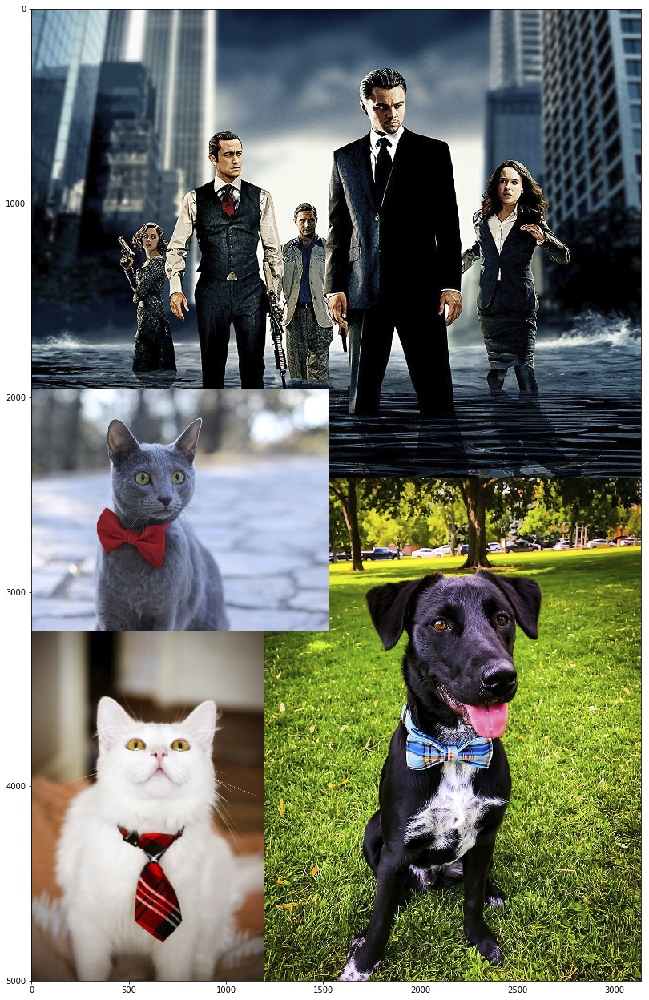

In [25]:
draw_labeled_image(img, None)

# Apply detection model (sliding window)

In current example image has big resolution, and the models were trained with the smaller one. 

Thus we are going to aply models in a sliding window manner. Learn more here:

https://supervise.ly/explore/notebooks/guide-04-neural-network-inference-20/overview

https://supervise.ly/explore/notebooks/guide-06-neural-network-inference-modes-215/overview

In [26]:
detection_sliding_window_config = {
    "name": "sliding_window_det",

    # Sliding window parameters.

    # Width and height in pixels.
    # Cannot be larger than the original image.
    "window": {
      "width": 1000,
      "height": 1000,
    },

    # Minimum overlap for each dimension. The last
    # window in every dimension may have higher overlap
    # with the previous one if necessary to fit the whole
    # window within the original image.
    "min_overlap": {
      "x": 200,
      "y": 200,
    },

    # Whether to save each sliding window instance as a
    # bounding box rectangle.
    "save": False,

    # If saving the sliding window bounding boxes, which
    # class name to use.
    "class_name": 'sliding_window_bbox',

    "nms_after": {

      # Whether to run non-maximum suppression after accumulating
      # all the detection results from the sliding windows.
      "enable": True,

      # Intersection over union threshold above which the same-class
      # detection labels are considered to be significantly inersected
      # for non-maximum suppression.
      "iou_threshold": 0.2,

      # Tag name from which to read detection confidence by which we
      # rank the detections. This tag must be added by the model to
      # every detection label.
      "confidence_tag_name": "confidence"
    },
    
    # Class renaming and filtering settings.
    # See "Full image inference" example for details.
    "model_classes": {
      "add_suffix": "_det",
      "save_classes": ["tie"]
    },
    
    "model_tags": {
      "add_suffix": "_det",
      "save_names": "__all__"
    }
}

In [27]:
ann_json = api.model.inference(model_detection.id, img, mode=detection_sliding_window_config)
print(ann_json)

{'description': '', 'size': {'height': 5000, 'width': 3137}, 'tags': [], 'objects': [{'classTitle': 'tie_det', 'description': '', 'tags': [{'name': 'confidence_det', 'value': 0.9625}], 'points': {'exterior': [[1766, 674], [1851, 990]], 'interior': []}}, {'classTitle': 'tie_det', 'description': '', 'tags': [{'name': 'confidence_det', 'value': 0.9773}], 'points': {'exterior': [[1966, 3737], [2350, 3922]], 'interior': []}}, {'classTitle': 'tie_det', 'description': '', 'tags': [{'name': 'confidence_det', 'value': 0.9807}], 'points': {'exterior': [[375, 2608], [733, 2866]], 'interior': []}}, {'classTitle': 'tie_det', 'description': '', 'tags': [{'name': 'confidence_det', 'value': 0.9827}], 'points': {'exterior': [[976, 908], [1050, 1086]], 'interior': []}}, {'classTitle': 'tie_det', 'description': '', 'tags': [{'name': 'confidence_det', 'value': 0.9957}], 'points': {'exterior': [[525, 4317], [774, 4807]], 'interior': []}}], 'success': True}


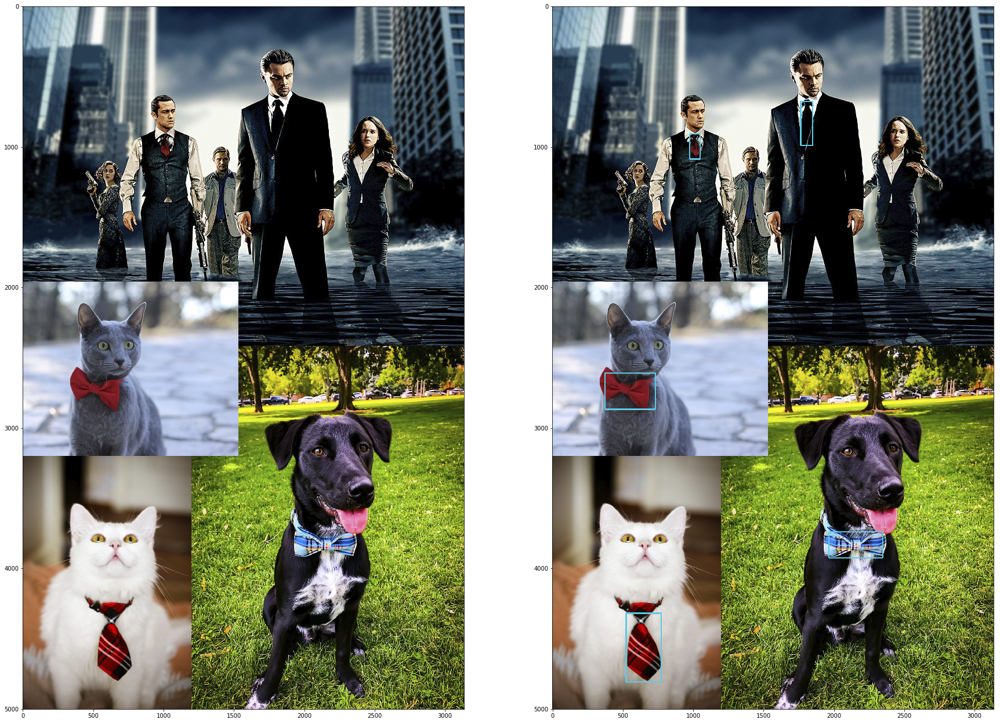

In [28]:
# Deserialize the annotation using the model meta information that
# we received previously.
ann_det = sly.Annotation.from_json(ann_json, model_detection_meta)

# Render the inference results.
draw_labeled_image(img, ann_det)

# Apply segmentation model (sliding window)

In [29]:
segmentation_sliding_window_config = {
    "name": "sliding_window",

    # Sliding window parameters.

    # Width and height in pixels.
    # Cannot be larger than the original image.
    "window": {
      "width": 2000,
      "height": 2000,
    },

    # Minimum overlap for each dimension. The last
    # window in every dimension may have higher overlap
    # with the previous one if necessary to fit the whole
    # window within the original image.
    "min_overlap": {
      "x": 400,
      "y": 400,
    },

    # Whether to save each sliding window instance as a
    # bounding box rectangle.
    #"save": False,

    # If saving the sliding window bounding boxes, which
    # class name to use.
    #"class_name": 'sliding_window_bbox',
    
    # Class renaming and filtering settings.
    # See "Full image inference" example for details.
    "model_classes": {
      "add_suffix": "_seg",
      "save_classes": ["person", "dog", "cat"]
    },
    
    #"model_tags": {
    #  "add_suffix": "",
    #  "save_names": "__all__"
    #}
}

In [30]:
ann_json = api.model.inference(model_segmentation.id, img, mode=segmentation_sliding_window_config)
#print(ann_json)

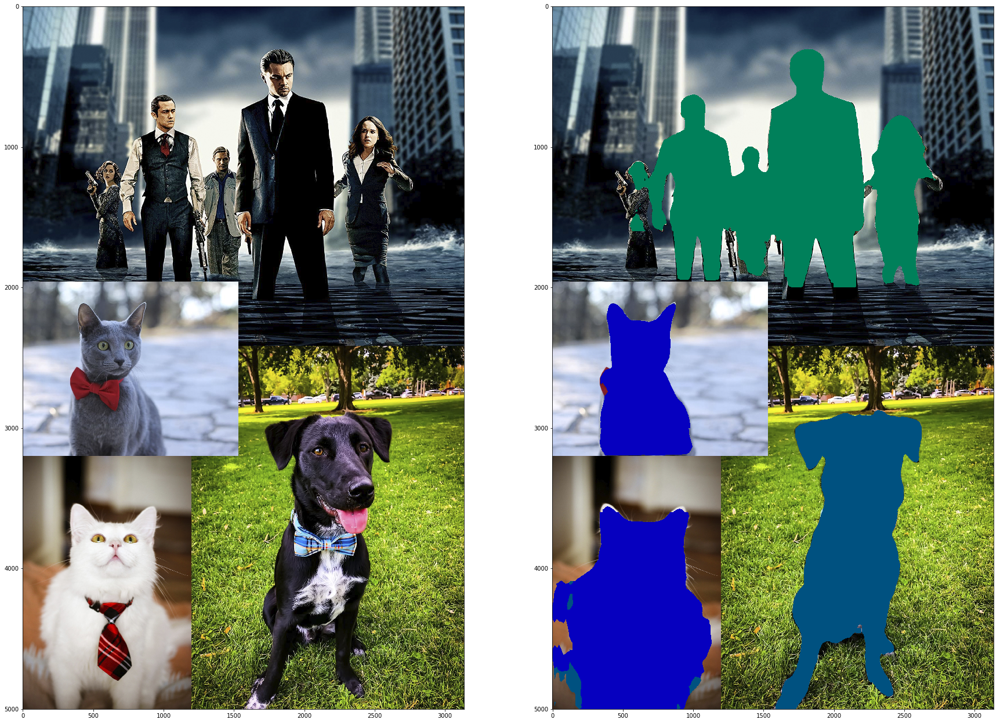

In [31]:
# Deserialize the annotation using the model meta information that
# we received previously.
ann_seg = sly.Annotation.from_json(ann_json, model_segmentation_meta)

# Render the inference results.
draw_labeled_image(img, ann_seg, draw_fill=True)

# Postprocessing step: keep only ties that are on the cats

In [32]:
def _render_labels_for_class_name(labels, class_name, canvas):
    for label in labels:
        if label.obj_class.name == class_name:
            label.geometry.draw(canvas, True)

def safe_ratio(num, denom):
    return (num / denom) if denom != 0 else 0

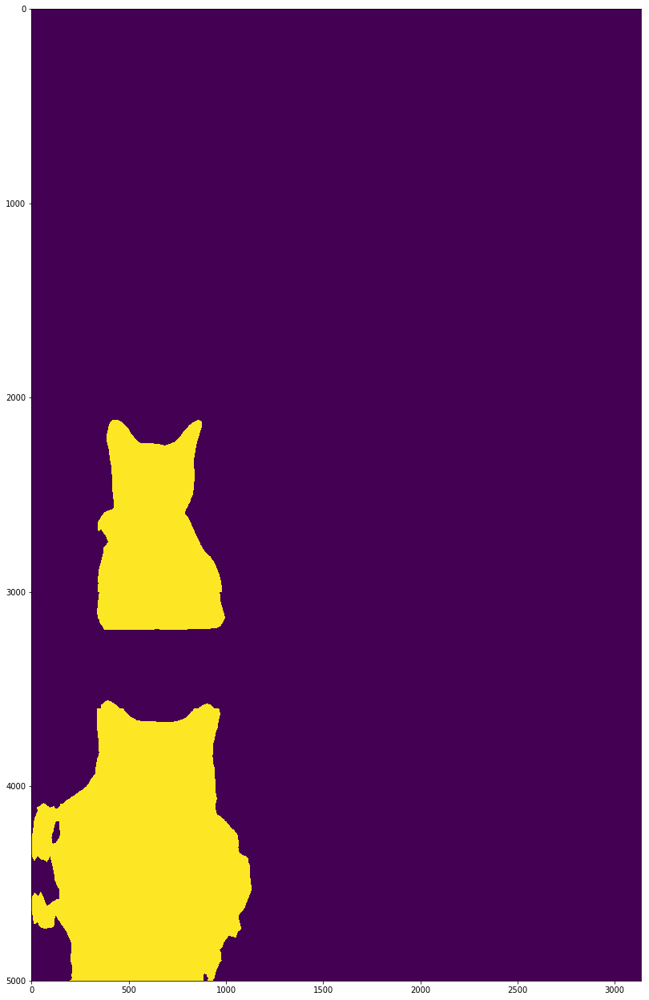

In [33]:
# rasterize all objects of class "cat"
mask_cat = np.full(ann_seg.img_size, False)
_render_labels_for_class_name(ann_seg.labels, "cat_seg", mask_cat)
draw_labeled_image(mask_cat, None)

In [34]:
filtered_ties = []
for label in ann_det.labels:
    if label.obj_class.name == "tie_det":
        temp_mask = np.full(ann_det.img_size, False)
        label.geometry.draw(temp_mask, True)
        
        # construct intersection and union bitmaps, calculate IoU metric
        intersection = mask_cat & temp_mask
        intersection_ratio = safe_ratio(intersection.sum(), temp_mask.sum())
        print(intersection_ratio)
        if intersection_ratio > 0.7:
            filtered_ties.append(label)
        #uncomment for debug visualization
        #draw_labeled_image(temp_mask, None)

0.0
0.0
0.9915681698411504
0.0
1.0


In [35]:
# replace labels in detection results
ann_det_filtered = ann_det.clone(labels=filtered_ties)

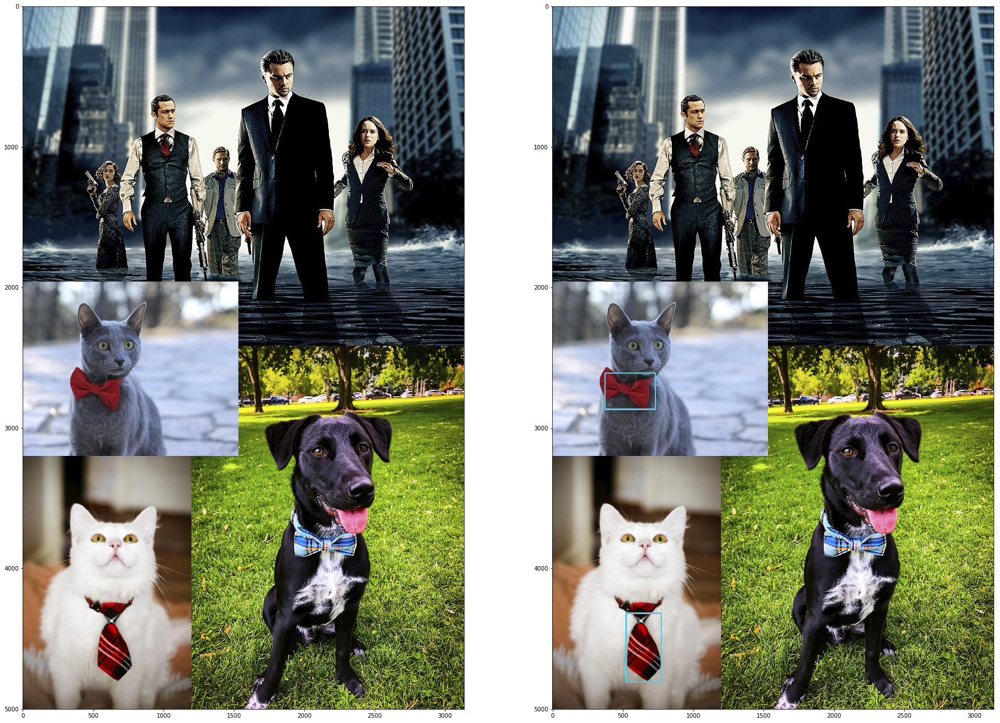

In [36]:
# Render the filtered results.
draw_labeled_image(img, ann_det_filtered)

# Mission complete!